In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import glob
train_img_path = glob.glob("/content/drive/MyDrive/19CSE305-Lab/Project/images/*.jpg")

In [ ]:
# Import the libraries
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input as pi_VGG16
from tensorflow.keras.models import Model as M_VGG16
from pathlib import Path
from PIL import Image

In [ ]:
from keras.applications.resnet import ResNet50
from keras.applications.resnet import preprocess_input as pi_ResNet50
from keras.models import  Model as M_ResNet50
from keras.models import load_model
from keras_preprocessing import image
import numpy as np

In [ ]:
class FeatureExtractor:
    def __init__(self,base_model):
        if base_model=='VGG16':
            # Use VGG-16 as the architecture and ImageNet for the weight
            base_model = VGG16(weights='imagenet')
            # Customize the model to return features from fully-connected layer
            self.model = M_VGG16(inputs=base_model.input, outputs=base_model.get_layer('fc1').output)
        elif base_model=='ResNet50':
            base_model = ResNet50(weights='imagenet',input_shape=(224,224,3))
            self.model = M_ResNet50(base_model.input,base_model.layers[-2].output)
    def extract(self, base_model,img):
        # Extract Features
        if base_model=='VGG16':
            # Resize the image
            img = img.resize((224, 224))
            # Convert the image color space
            img = img.convert('RGB')
            # Reformat the image
            img = image.img_to_array(img)
            img = np.expand_dims(img, axis=0)
            img = pi_VGG16(img)
            feature_v = self.model.predict(img)[0]
            return feature_v / np.linalg.norm(feature_v)
        elif base_model=='ResNet50':
            # Resize the image
            img = img.resize((224, 224))
            # Convert the image color space
            img = img.convert('RGB')
            img = image.img_to_array(img)
            img = np.expand_dims(img,axis=0)
            img = pi_ResNet50(img)
            feature_v = self.model.predict(img)
            feature_v = feature_v.reshape((-1,))
            return feature_v

###Using **VGG16**

In [ ]:
# Iterate through images 
v_fe = FeatureExtractor('VGG16')
v_features = []
v_img_paths = []
v_features_dict ={}
v_names =[]
for img_path in sorted(train_img_path):
    v_img_paths.append(img_path)
    # Extract Features
    v_feature = v_fe.extract('VGG16',img=Image.open(img_path))
    v_features.append(v_feature)
    name = img_path.split("/")[-1]
    v_names.append(name)
    v_features_dict[name]=v_feature
    v_feature_path = "/content/drive/MyDrive/19CSE305-Lab/Project/FEATURES.npy"
    np.save(v_feature_path, v_feature)

###Using Euclidean distance

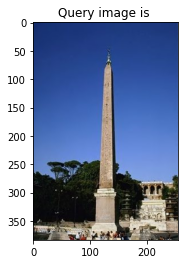



Similar images are:




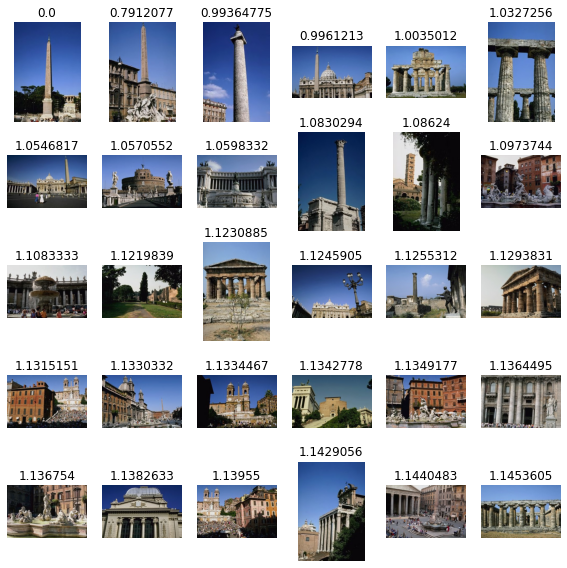

In [ ]:
# Import the libraries
import matplotlib.pyplot as plt
import numpy as np
# Insert the image query
img = Image.open("/content/drive/MyDrive/19CSE305-Lab/Project/images/224.jpg")
plt.imshow(img)
# Extract its features
query = v_fe.extract('VGG16',img)
# Calculate the similarity (distance) between images
dists = []
for feature in v_features:
  dists.append(np.linalg.norm(feature - query))
# Extract 30 images that have lowest distance
ids = np.argsort(dists)[:30]
scores = [(dists[id], v_img_paths[id]) for id in ids]
# Visualize the result
plt.title('Query image is ')
imgplot = plt.imshow(img)
plt.show()
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
print('\n')
print('\033[1m' + 'Similar images are:' + '\033[0m')
print('\n')
for a in range(5*6):
    score = scores[a]
    axes.append(fig.add_subplot(5, 6, a+1))
    subplot_title=str(score[0])
    axes[-1].set_title(subplot_title)  
    plt.axis('off')
    plt.imshow(Image.open(score[1]))
fig.tight_layout()
plt.show()

###Using cosine similarity

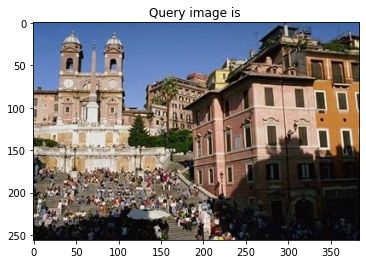



Similar images are:




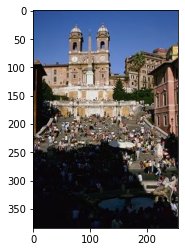

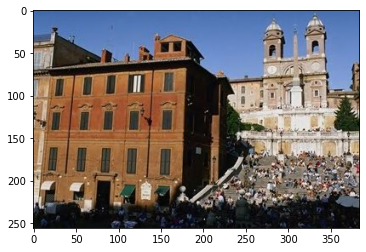

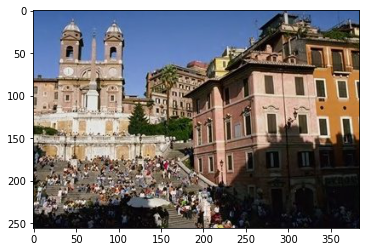

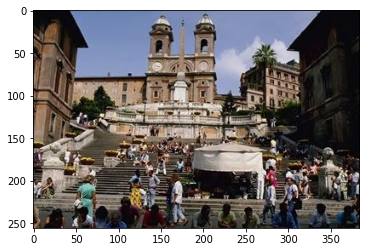

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics.pairwise import cosine_similarity
v_names = list(v_features_dict.keys())
plt.title('Query image is ')
img = mpimg.imread('/content/drive/MyDrive/19CSE305-Lab/Project/images/'+v_names[20])
imgplot = plt.imshow(img)
plt.show()
real_img = v_features_dict[v_names[20]]
print('\n')
print('\033[1m' + 'Similar images are:' + '\033[0m')
print('\n')
for j in range(len(v_names)):
  cos=cosine_similarity(real_img.reshape(1,-1),v_features_dict[v_names[j]].reshape(1,-1))
  if cos>0.65:
    img=mpimg.imread('/content/drive/MyDrive/19CSE305-Lab/Project/images/'+v_names[j])
    imgplot=plt.imshow(img)
    plt.show()
    plt.show()

###Using **ResNet50**

In [ ]:
r_fe = FeatureExtractor('ResNet50')
r_features = []
r_img_paths = []
r_features_dict ={}
r_names =[]
for img_path in sorted(train_img_path):
    r_img_paths.append(img_path)
    r_feature= r_fe.extract('ResNet50',img=Image.open(img_path))
    r_features.append(r_feature)
    name = img_path.split("/")[-1]
    r_names.append(name)
    r_features_dict[name]=r_feature
    # Save the Numpy array (.npy) on designated path
    r_feature_path = "/content/drive/MyDrive/19CSE305-Lab/Project/FEATURES.npy"
    np.save(r_feature_path, r_feature)

###Using Euclidean distance

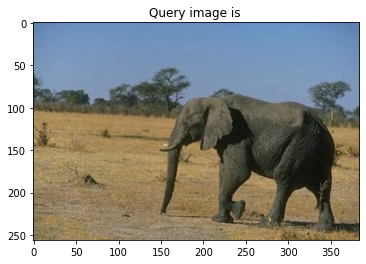



Similar images are:




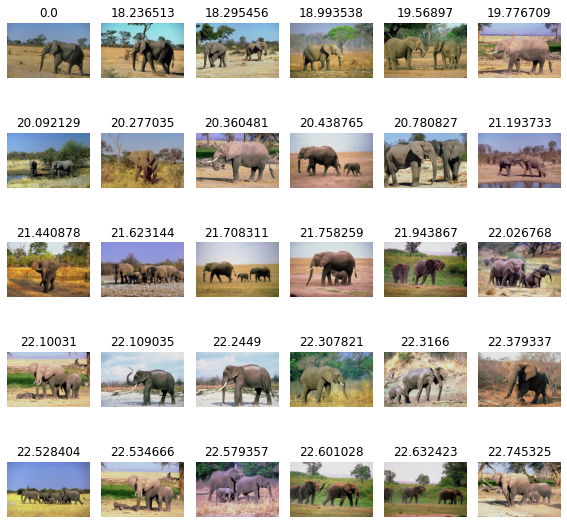

In [ ]:
# Import the libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
# Insert the image query
img = Image.open("/content/drive/MyDrive/19CSE305-Lab/Project/images/570.jpg")
plt.imshow(img)
# Extract its features
query = r_fe.extract('ResNet50',img)
# Calculate the similarity (distance) between images
dists = []
for feature in r_features:
  dists.append(np.linalg.norm(feature - query))
# Extract 30 images that have lowest distance
ids = np.argsort(dists)[:30]
scores = [(dists[id], r_img_paths[id]) for id in ids]
plt.title('Query image is ')
imgplot = plt.imshow(img)
plt.show()
# Visualize the result
axes=[]
fig=plt.figure(figsize=(8,8))
print('\n')
print('\033[1m' + 'Similar images are:' + '\033[0m')
print('\n')
for a in range(5*6):
    score = scores[a]
    axes.append(fig.add_subplot(5, 6, a+1))
    subplot_title=str(score[0])
    axes[-1].set_title(subplot_title)  
    plt.axis('off')
    plt.imshow(Image.open(score[1]))
fig.tight_layout()
plt.show()

###Using cosine similarity

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_similarity(r_features_dict[r_names[120]].reshape(1,-1),r_features_dict[r_names[120]].reshape(1,-1))

array([[1.0000004]], dtype=float32)

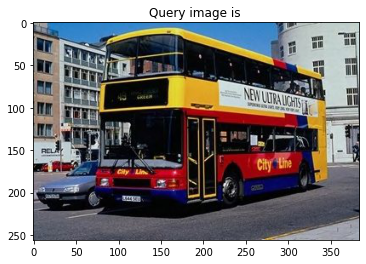



Similar images are:




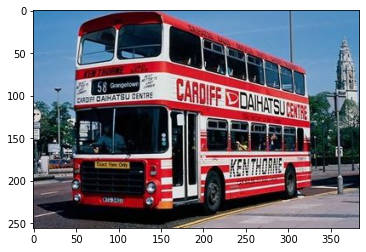

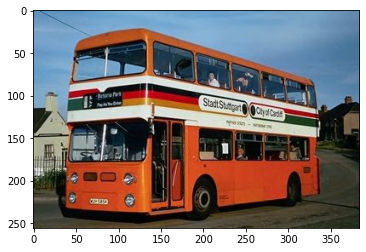

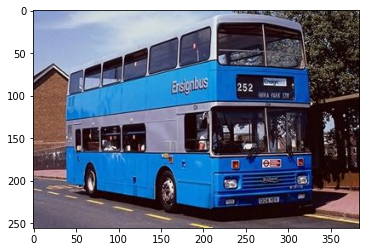

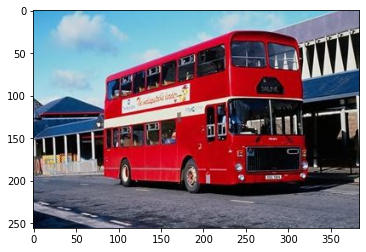

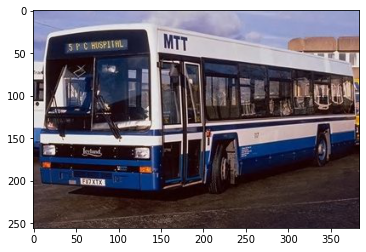

...

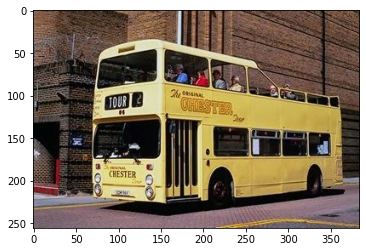

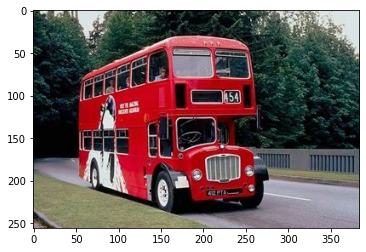

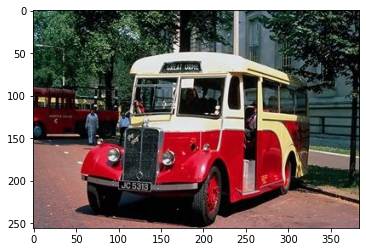

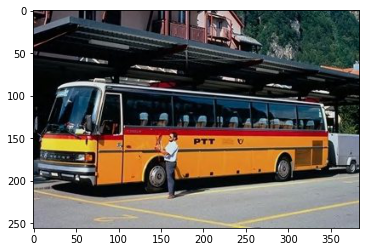

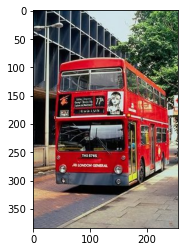

In [ ]:
r_names = list(r_features_dict.keys())
plt.title('Query image is ')
img = mpimg.imread('/content/drive/MyDrive/19CSE305-Lab/Project/images/'+r_names[120])
imgplot = plt.imshow(img)
plt.show()
real_img = r_features_dict[r_names[120]]
print('\n')
print('\033[1m' + 'Similar images are:' + '\033[0m')
print('\n')
for j in range(len(r_names)):
  cos=cosine_similarity(real_img.reshape(1,-1),r_features_dict[r_names[j]].reshape(1,-1))
  if cos>0.65:
    img=mpimg.imread('/content/drive/MyDrive/19CSE305-Lab/Project/images/'+r_names[j])
    imgplot=plt.imshow(img)
    plt.show()
    plt.show()

###Testing

In [ ]:
tv_fe = FeatureExtractor('VGG16')
tv_features = []
tv_names = []
tv_img_paths = []
tv_features_dict ={}
tv_names =[]
test_img_path = glob.glob("/content/drive/MyDrive/19CSE305-Lab/Project/Test images/*.jpg")
for img_path in sorted(test_img_path):
    tv_img_paths.append(img_path)
    # Extract Features
    tv_feature = tv_fe.extract('VGG16',img=Image.open(img_path))
    tv_features.append(tv_feature)
    name = img_path.split("/")[-1]
    tv_names.append(name)
    tv_features_dict[name]=tv_feature
    tv_feature_path = "/content/drive/MyDrive/19CSE305-Lab/Project/FEATURES.npy"
    np.save(tv_feature_path, tv_feature)

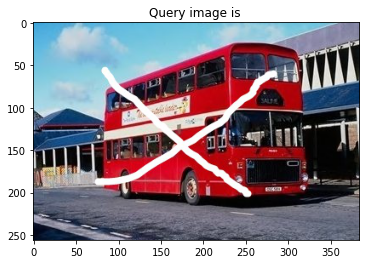



Similar images are:




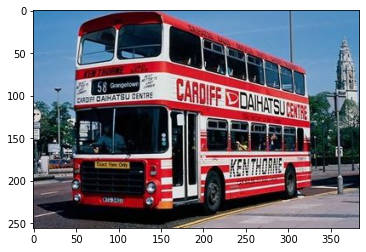

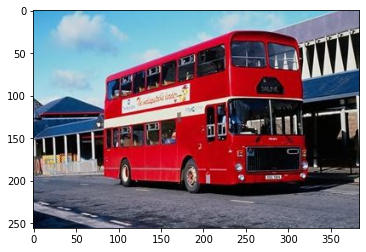

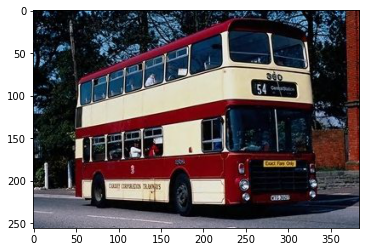

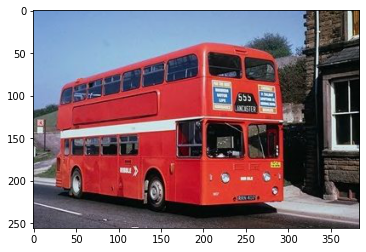

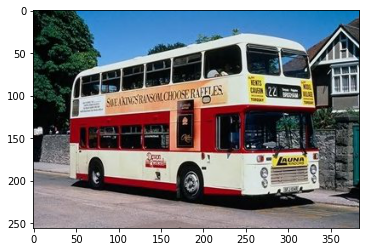

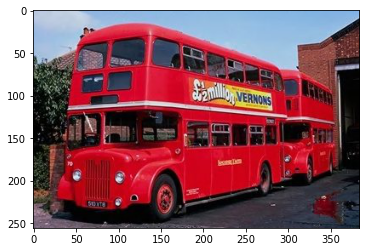

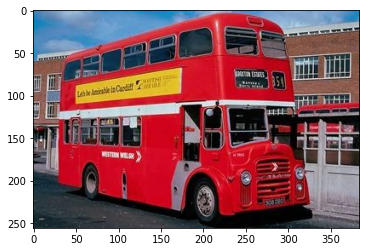

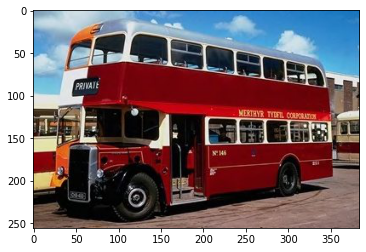

In [ ]:
plt.title('Query image is ')
img = mpimg.imread('/content/drive/MyDrive/19CSE305-Lab/Project/Test images/'+tv_names[4])
imgplot = plt.imshow(img)
plt.show()
real_img = tv_features_dict[tv_names[4]]
print('\n')
print('\033[1m' + 'Similar images are:' + '\033[0m')
print('\n')
for j in range(len(v_names)):
  cos=cosine_similarity(real_img.reshape(1,-1),v_features_dict[v_names[j]].reshape(1,-1))
  if cos>0.65:
    img=mpimg.imread('/content/drive/MyDrive/19CSE305-Lab/Project/images/'+v_names[j])
    imgplot=plt.imshow(img)
    plt.show()
    plt.show()

###**Analysis**

####ResNet50 vs VGG16


*   Resnet is faster than VGG
*   Even though ResNet is much deeper than VGG16 and VGG19, the model size is actually substantially smaller due to the usage of global average pooling rather than fully-connected layers which reduces the model size down to 102MB for ResNet50

####Using Euclidean distance vs cosine similarity

*   In nearest neighbors method we calculate distance between the feature vectors and find top n images that are closer to the query image

*   Cosine similarity measures the similarity between two vectors of an inner product space. It is measured by the cosine of the angle between two vectors and determines whether two vectors are pointing in roughly the same direction



##**SVM Model**

In [ ]:
import numpy as np
import os
from pathlib import Path
import matplotlib.pyplot as plt
from keras.preprocessing import image

In [ ]:
DATADIR = '/content/drive/MyDrive/19CSE305-Lab/Project/training_set'
CATEGORIES = ['beaches','bus','dinosaurs','elephants','flowers','foods','horses','monuments','mountains_and_snow','peolpe_and_villages_in_Africa']
IMG_SIZE=100

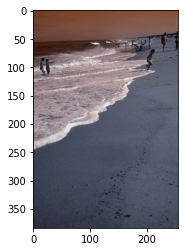

In [ ]:
for category in CATEGORIES:
    path=os.path.join(DATADIR, category)
    for img in os.listdir(path):
        img_array=cv2.imread(os.path.join(path,img))
        plt.imshow(img_array)
        plt.show()
        break
    break

In [ ]:
training_data=[]
def create_training_data():
    for category in CATEGORIES:
        path=os.path.join(DATADIR, category)
        class_num=CATEGORIES.index(category)
        for img in os.listdir(path):
            try:
                img_array=cv2.imread(os.path.join(path,img))
                new_array=cv2.resize(img_array,(IMG_SIZE,IMG_SIZE))
                training_data.append([new_array,class_num])
            except Exception as e:
                pass
create_training_data()   

In [ ]:
print(len(training_data))

900


In [ ]:
lenofimage = len(training_data)

In [ ]:
X=[]
y=[]

for categories, label in training_data:
    X.append(categories)
    y.append(label)
X= np.array(X).reshape(lenofimage,-1)
##X = tf.keras.utils.normalize(X, axis = 1)

In [ ]:
X.shape

(900, 30000)

In [ ]:
X = X/255.0

In [ ]:
X[1]

array([0.61568627, 0.58823529, 0.52156863, ..., 0.54509804, 0.5372549 ,
       0.49803922])

In [ ]:
y=np.array(y)

In [ ]:
y.shape

(900,)

In [ ]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [ ]:
from sklearn.svm import SVC
svc = SVC(kernel='linear',gamma='auto')
svc.fit(X_train, y_train)

SVC(gamma='auto', kernel='linear')

In [ ]:
y2 = svc.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
print("Accuracy on unknown data is",accuracy_score(y_test,y2))

Accuracy on unknown data is 0.7066666666666667


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y2))

              precision    recall  f1-score   support

           0       0.41      0.67      0.51        18
           1       0.82      0.82      0.82        22
           2       1.00      1.00      1.00        22
           3       0.81      0.81      0.81        26
           4       0.69      0.95      0.80        21
           5       0.85      0.59      0.69        29
           6       1.00      1.00      1.00        22
           7       0.36      0.26      0.30        19
           8       0.48      0.50      0.49        26
           9       0.64      0.45      0.53        20

    accuracy                           0.71       225
   macro avg       0.71      0.70      0.70       225
weighted avg       0.72      0.71      0.70       225



In [ ]:
result = pd.DataFrame({'original' : y_test,'predicted' : y2})

In [ ]:
result

,original,predicted
0,9,9
1,3,9
2,1,1
3,0,7
4,1,9
...,...,...
220,3,1
221,1,1
222,3,3
223,7,8
